In [6]:
%ls
%cd img_data

homography.ipynb  img_data/  input/  output/  panorama.ipynb
/home/devrok/aiexpert/ai-vision/3D_Reconstruction/img_data


interactive python backend를 설치합니다.

In [8]:
# https://stackoverflow.com/questions/74248955/how-to-display-the-coordinates-of-the-points-clicked-on-the-image-in-google-cola
!pip install ipympl
#from google.colab import output
#output.enable_custom_widget_manager()
%matplotlib ipympl

## DLT를 이용한 homography estimation


1.   4쌍 이상의 대응점(correspondence) 찾기
2.   $Ah=0$ 형태의 equation 만들기
3.   SVD를 통해 $h$를 구한 뒤, reshape하여 homography matrix $H$ 만들기


<!-- <img src ="https://drive.google.com/uc?id=12bDRiJIiuw3tDZnE8twp1rWco1abdFgh"  height=400>   -->

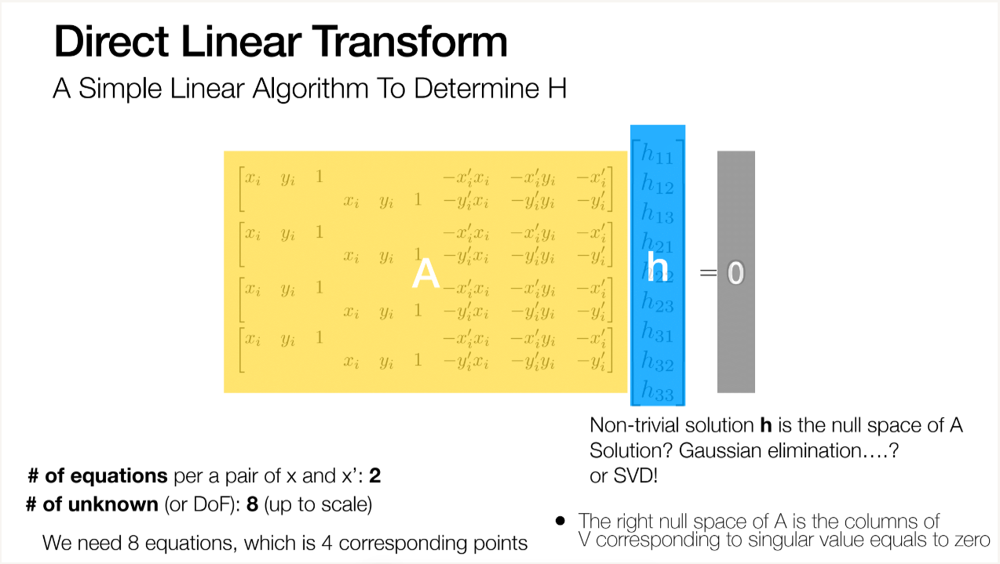

image source : Prof.Joo's lecture note

두 개의 이미지를 불러와 대응점을 찾아보겠습니다.

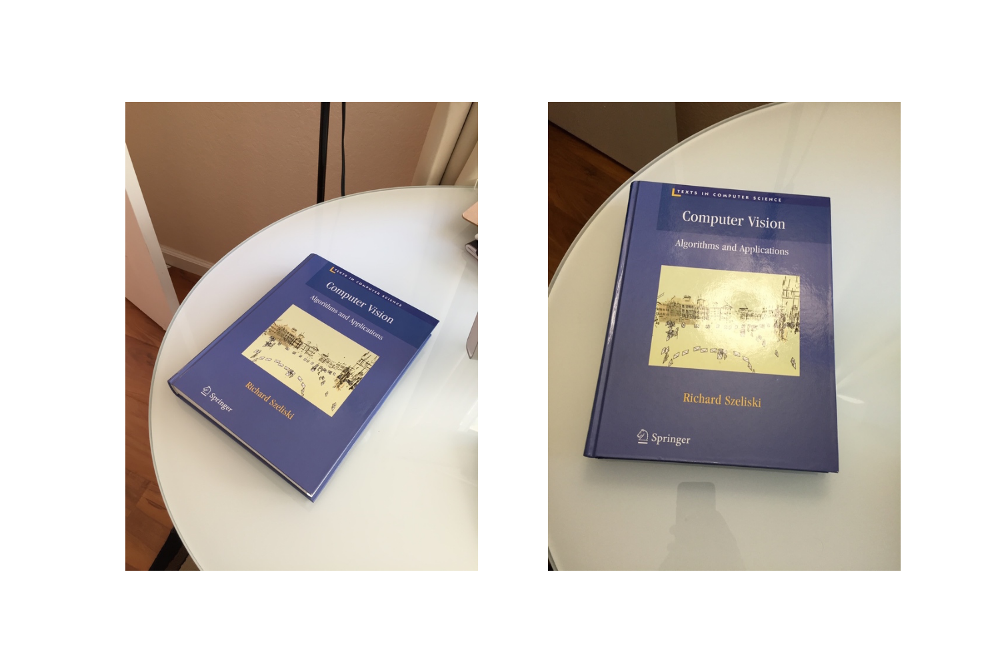

In [17]:
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 10))
ax1.axis('off'), ax2.axis('off')
clicks1, clicks2 = [], []

def onclick(event):
    # 이벤트가 발생한 축 확인
    ax = event.inaxes
    if ax is not None:
        # 이미지1에서 클릭한 경우
        if ax == ax1:
            clicks1.append([event.xdata, event.ydata])
            ax.plot(event.xdata, event.ydata, 'ro')

        # 이미지2에서 클릭한 경우
        elif ax == ax2:
            clicks2.append([event.xdata, event.ydata])
            ax.plot(event.xdata, event.ydata, 'ro')

img1 = plt.imread('book1.jpg')
img2 = plt.imread('book2.jpg')
ax1.imshow(img1)
ax2.imshow(img2)

fig.canvas.draw()  # 그림을 다시 그립니다.

# 콜백 함수를 등록합니다.
cid = fig.canvas.mpl_connect('button_press_event', onclick)

plt.show()

선택된 대응점들(correspondences)을 확인해보겠습니다.

In [18]:
print(f'clicked pixels in image1: {clicks1}')
print(f'clicked pixels in image2: {clicks2}')

clicked pixels in image1: [[285.07419354838714, 344.9967741935483], [431.5516129032259, 433.5645161290322], [349.79677419354846, 534.6225806451612], [197.64193548387098, 429.02258064516127]]
clicked pixels in image2: [[192.99677419354873, 276.86774193548376], [426.9064516129034, 297.3064516129032], [426.9064516129034, 465.358064516129], [171.42258064516147, 446.05483870967737]]


대응점들을 이용해 $Ax=0$ 꼴의 equation을 만들어주겠습니다.

<!-- <img src ="https://drive.google.com/uc?id=10e5CKXITDWQrRIyiMSyJraiItmKDhqqh"  height=250> -->
<!-- <img src="https://drive.google.com/uc?export=view&id=1KpnKvEggQlHSLUgLff4zbS7ayHcr2cdb/view?usp=share_link"  height=250> -->

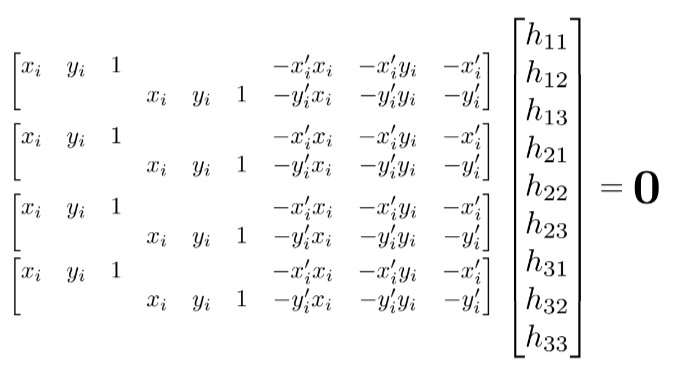

image source : Prof.Joo's lecture note

In [19]:
A = []
for i in range(4):
    x, y = clicks1[i]
    x_prime, y_prime = clicks2[i]
    A.append([x, y, 1, 0, 0, 0, -x*x_prime, -y*x_prime, -x_prime])
    A.append([0, 0, 0, x, y, 1, -x*y_prime, -y*y_prime, -y_prime])

SVD를 통해 $h$를 계산하고, reshape하여 homography matrix $H$를 얻습니다.
수업 시간에 배우신대로 $H$는 up-to-scale이지만, opencv에서 마지막 성분이 1이 되도록 normalize하기 때문에 이를 따르도록 하겠습니다.

In [20]:
import numpy as np
U, S, VT = np.linalg.svd(np.asarray(A))
h = VT.T[:,-1]
H = np.reshape(h, (3, 3))
H /= H[2, 2]
print(H)

[[ 1.78865725e+00  1.49201918e+00 -7.53157528e+02]
 [-7.33021601e-01  2.04886915e+00 -1.08423970e+02]
 [ 6.56358209e-04  6.36432390e-04  1.00000000e+00]]


OpenCV의 함수를 이용해서 계산한 결과와 비교해보겠습니다!

In [21]:
import cv2
H_cv2, _ = cv2.findHomography(np.array(clicks1), np.array(clicks2))
print(H_cv2)

[[ 1.78865569e+00  1.49201705e+00 -7.53156542e+02]
 [-7.33020950e-01  2.04886663e+00 -1.08423600e+02]
 [ 6.56357415e-04  6.36429721e-04  1.00000000e+00]]


대응점 하나를 warping해서 homography matrix가 잘 구해졌는지 확인해보겠습니다.

In [22]:
corres1_h = np.array([clicks1[0][0], clicks1[0][1], 1.0])
warped_h = H_cv2 @ corres1_h
warped_pixel = warped_h[:2] / warped_h[2]

print(f'pixel in image1: {clicks1[0]}')
print(f'warped pixel with H: {warped_pixel}')
print(f'pixel in image2: {clicks2[0]}')

pixel in image1: [285.07419354838714, 344.9967741935483]
warped pixel with H: [192.99679549 276.86774542]
pixel in image2: [192.99677419354873, 276.86774193548376]


이미지 전체를 warping해보겠습니다.

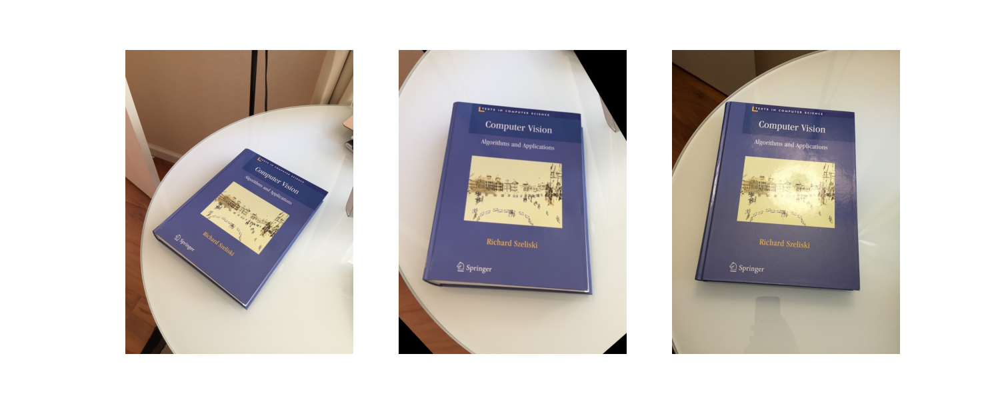

In [23]:
warped_img = cv2.warpPerspective(img1, H, (img2.shape[1], img2.shape[0]))
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 6))
ax1.axis('off'), ax2.axis('off'), ax3.axis('off')
ax1.imshow(img1)
ax2.imshow(warped_img)
ax3.imshow(img2)
plt.show()

## Example: NewJeans on the bus

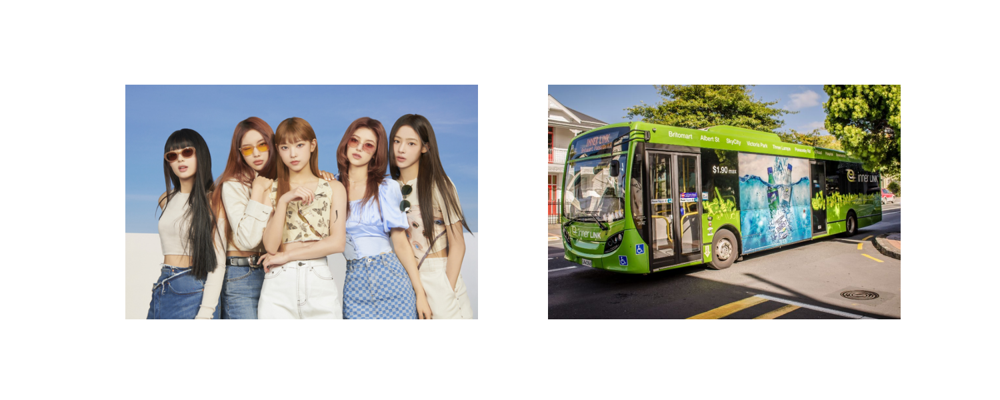

In [55]:
%matplotlib ipympl
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
ax1.axis('off'), ax2.axis('off')
clicks1, clicks2 = [], []

def onclick(event):
    # 이벤트가 발생한 축 확인
    ax = event.inaxes
    if ax is not None:
        # 이미지1에서 클릭한 경우
        if ax == ax1:
            clicks1.append([event.xdata, event.ydata])
            ax.plot(event.xdata, event.ydata, 'ro')

        # 이미지2에서 클릭한 경우
        elif ax == ax2:
            clicks2.append([event.xdata, event.ydata])
            ax.plot(event.xdata, event.ydata, 'ro')

img1 = plt.imread('newjeans.jpg')
img2 = plt.imread('bus.jpg')
ax1.imshow(img1)
ax2.imshow(img2)

fig.canvas.draw()  # 그림을 다시 그립니다.

# 콜백 함수를 등록합니다.
cid = fig.canvas.mpl_connect('button_press_event', onclick)

plt.show()

In [56]:
import cv2
H, _ = cv2.findHomography(np.array(clicks1), np.array(clicks2))

In [57]:
newjeans_orig = plt.imread('newjeans.jpg')
bus_orig = plt.imread('bus.jpg')
warped_img1 = cv2.warpPerspective(newjeans_orig, H, (bus_orig.shape[1], bus_orig.shape[0]))
result = np.where(warped_img1 != [0, 0, 0], warped_img1, bus_orig)

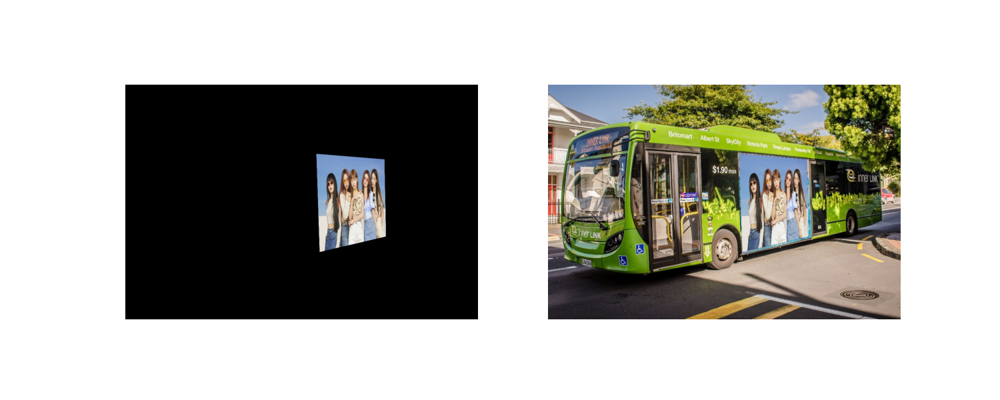

In [58]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
ax1.axis('off'), ax2.axis('off')
ax1.imshow(warped_img1)
ax2.imshow(result)
plt.show()